In [5]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/sosona2006/hed-pretrained/hed_pretrained_bsds.caffemodel
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0213.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0057.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0104.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0298.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0397.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0186.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0362.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0252.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0011.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0276.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0097.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0288.JPG
/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0284.J

In [ ]:
prototxt = """name: "FCN"

input: "data"
input_dim: 1
input_dim: 3
input_dim: 500
input_dim: 500

layer { bottom: 'data' top: 'conv1_1' name: 'conv1_1' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 64 pad: 35 kernel_size: 3 } }
layer { bottom: 'conv1_1' top: 'conv1_1' name: 'relu1_1' type: "ReLU" }
layer { bottom: 'conv1_1' top: 'conv1_2' name: 'conv1_2' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 64 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv1_2' top: 'conv1_2' name: 'relu1_2' type: "ReLU" }
layer { name: 'pool1' bottom: 'conv1_2' top: 'pool1' type: "Pooling"
  pooling_param { pool: MAX kernel_size: 2 stride: 2 } }

layer { name: 'conv2_1' bottom: 'pool1' top: 'conv2_1' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 128 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv2_1' top: 'conv2_1' name: 'relu2_1' type: "ReLU" }
layer { bottom: 'conv2_1' top: 'conv2_2' name: 'conv2_2' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 128 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv2_2' top: 'conv2_2' name: 'relu2_2' type: "ReLU" }
layer { bottom: 'conv2_2' top: 'pool2' name: 'pool2' type: "Pooling"
  pooling_param { pool: MAX kernel_size: 2 stride: 2 } }

layer { bottom: 'pool2' top: 'conv3_1' name: 'conv3_1' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 256 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv3_1' top: 'conv3_1' name: 'relu3_1' type: "ReLU" }
layer { bottom: 'conv3_1' top: 'conv3_2' name: 'conv3_2' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 256 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv3_2' top: 'conv3_2' name: 'relu3_2' type: "ReLU" }
layer { bottom: 'conv3_2' top: 'conv3_3' name: 'conv3_3' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 256 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv3_3' top: 'conv3_3' name: 'relu3_3' type: "ReLU" }
layer { bottom: 'conv3_3' top: 'pool3' name: 'pool3' type: "Pooling"
  pooling_param { pool: MAX kernel_size: 2 stride: 2 } }

layer { bottom: 'pool3' top: 'conv4_1' name: 'conv4_1' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 512 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv4_1' top: 'conv4_1' name: 'relu4_1' type: "ReLU" }
layer { bottom: 'conv4_1' top: 'conv4_2' name: 'conv4_2' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 512 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv4_2' top: 'conv4_2' name: 'relu4_2' type: "ReLU" }
layer { bottom: 'conv4_2' top: 'conv4_3' name: 'conv4_3' type: "Convolution"
  param { lr_mult: 1 decay_mult: 1 } param { lr_mult: 2 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 512 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv4_3' top: 'conv4_3' name: 'relu4_3' type: "ReLU" }
layer { bottom: 'conv4_3' top: 'pool4' name: 'pool4' type: "Pooling"
  pooling_param { pool: MAX kernel_size: 2 stride: 2 } }

layer { bottom: 'pool4' top: 'conv5_1' name: 'conv5_1' type: "Convolution"
  param { lr_mult: 100 decay_mult: 1 } param { lr_mult: 200 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 512 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv5_1' top: 'conv5_1' name: 'relu5_1' type: "ReLU" }
layer { bottom: 'conv5_1' top: 'conv5_2' name: 'conv5_2' type: "Convolution"
  param { lr_mult: 100 decay_mult: 1 } param { lr_mult: 200 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 512 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv5_2' top: 'conv5_2' name: 'relu5_2' type: "ReLU" }
layer { bottom: 'conv5_2' top: 'conv5_3' name: 'conv5_3' type: "Convolution"
  param { lr_mult: 100 decay_mult: 1 } param { lr_mult: 200 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 512 pad: 1 kernel_size: 3 } }
layer { bottom: 'conv5_3' top: 'conv5_3' name: 'relu5_3' type: "ReLU" }

## DSN conv 1 ###
layer { name: 'score-dsn1' type: "Convolution" bottom: 'conv1_2' top: 'score-dsn1-up'
  param { lr_mult: 0.01 decay_mult: 1 } param { lr_mult: 0.02 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 1 kernel_size: 1 } }
layer { type: "Crop" name: 'crop' bottom: 'score-dsn1-up' bottom: 'data' top: 'upscore-dsn1' }
layer { type: "Sigmoid" name: "sigmoid-dsn1" bottom: "upscore-dsn1"  top:"sigmoid-dsn1"}

### DSN conv 2 ###
layer { name: 'score-dsn2' type: "Convolution" bottom: 'conv2_2' top: 'score-dsn2'
  param { lr_mult: 0.01 decay_mult: 1 } param { lr_mult: 0.02 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 1 kernel_size: 1 } }
layer { type: "Deconvolution" name: 'upsample_2' bottom: 'score-dsn2' top: 'score-dsn2-up'
  param { lr_mult: 0 decay_mult: 1 } param { lr_mult: 0 decay_mult: 0}
  convolution_param { kernel_size: 4 stride: 2 num_output: 1 } }
layer { type: "Crop" name: 'crop' bottom: 'score-dsn2-up' bottom: 'data' top: 'upscore-dsn2' }
layer { type: "Sigmoid" name: "sigmoid-dsn2" bottom: "upscore-dsn2"  top:"sigmoid-dsn2"}

### DSN conv 3 ###
layer { name: 'score-dsn3' type: "Convolution" bottom: 'conv3_3' top: 'score-dsn3'
  param { lr_mult: 0.01 decay_mult: 1 } param { lr_mult: 0.02 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 1 kernel_size: 1 } }
layer { type: "Deconvolution" name: 'upsample_4' bottom: 'score-dsn3' top: 'score-dsn3-up'
  param { lr_mult: 0 decay_mult: 1 } param { lr_mult: 0 decay_mult: 0}
  convolution_param { kernel_size: 8 stride: 4 num_output: 1 } }
layer { type: "Crop" name: 'crop' bottom: 'score-dsn3-up' bottom: 'data' top: 'upscore-dsn3' }
layer { type: "Sigmoid" name: "sigmoid-dsn3" bottom: "upscore-dsn3"  top:"sigmoid-dsn3"}

###DSN conv 4###
layer { name: 'score-dsn4' type: "Convolution" bottom: 'conv4_3' top: 'score-dsn4'
  param { lr_mult: 0.01 decay_mult: 1 } param { lr_mult: 0.02 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 1 kernel_size: 1 } }
layer { type: "Deconvolution" name: 'upsample_8' bottom: 'score-dsn4' top: 'score-dsn4-up'
  param { lr_mult: 0 decay_mult: 1 } param { lr_mult: 0 decay_mult: 0}
  convolution_param { kernel_size: 16 stride: 8 num_output: 1 } }
layer { type: "Crop" name: 'crop' bottom: 'score-dsn4-up' bottom: 'data' top: 'upscore-dsn4' }
layer { type: "Sigmoid" name: "sigmoid-dsn4" bottom: "upscore-dsn4"  top:"sigmoid-dsn4"}

###DSN conv 5###
layer { name: 'score-dsn5' type: "Convolution" bottom: 'conv5_3' top: 'score-dsn5'
  param { lr_mult: 0.01 decay_mult: 1 } param { lr_mult: 0.02 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 1 kernel_size: 1 } }
layer { type: "Deconvolution" name: 'upsample_16' bottom: 'score-dsn5' top: 'score-dsn5-up'
  param { lr_mult: 0 decay_mult: 1 } param { lr_mult: 0 decay_mult: 0}
  convolution_param { kernel_size: 32 stride: 16 num_output: 1 } }
layer { type: "Crop" name: 'crop' bottom: 'score-dsn5-up' bottom: 'data' top: 'upscore-dsn5' }
layer { type: "Sigmoid" name: "sigmoid-dsn5" bottom: "upscore-dsn5"  top:"sigmoid-dsn5"}

### Concat and multiscale weight layer ###
layer { name: "concat" bottom: "upscore-dsn1"  bottom: "upscore-dsn2" bottom: "upscore-dsn3" 
         bottom: "upscore-dsn4" bottom: "upscore-dsn5" top: "concat-upscore" type: "Concat"
  concat_param { concat_dim: 1} }
layer { name: 'new-score-weighting' type: "Convolution" bottom: 'concat-upscore' top: 'upscore-fuse'
  param { lr_mult: 0.01 decay_mult: 1 } param { lr_mult: 0.02 decay_mult: 0}
  convolution_param { engine: CAFFE num_output: 1 kernel_size: 1 weight_filler {type: "constant" value: 0.2} } }
layer { type: "Sigmoid" name: "sigmoid-fuse" bottom: "upscore-fuse"  top:"sigmoid-fuse"}"""

with open("deploy.prototxt", "w") as f:
    f.write(prototxt)

print("deploy.prototxt created successfully.")

Resized image from (800, 600) to (384, 512) to save memory.


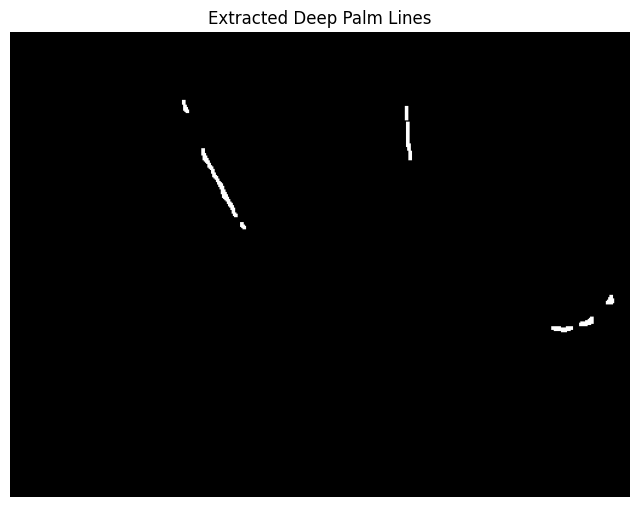

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. OpenCV requires a custom Crop Layer to parse the HED Caffe model correctly
class CropLayer(object):
    def __init__(self, params, blobs):
        self.xshift = 0
        self.yshift = 0

    def getMemoryShapes(self, inputs):
        inputShape, targetShape = inputs[0], inputs[1]
        batchSize, numChannels = inputShape[0], inputShape[1]
        height, width = targetShape[2], targetShape[3]
        return [[batchSize, numChannels, height, width]]

    def forward(self, inputs):
        inputData, targetData = inputs[0], inputs[1]
        return [inputData[:, :, self.yshift:self.yshift + targetData.shape[2], 
                          self.xshift:self.xshift + targetData.shape[3]]]

# Register the custom layer
cv2.dnn_registerLayer('Crop', CropLayer)

def extract_palm_lines(image_path, prototxt_path, model_path, max_dim=512):
    # 2. Load the network
    net = cv2.dnn.readNetFromCaffe(prototxt_path, model_path)

    # 3. Read and preprocess the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not read image at {image_path}")
        return
        
    # --- KERNEL CRASH FIX: Resize the image if it's too large ---
    H, W = image.shape[:2]
    if max(H, W) > max_dim:
        scale = max_dim / float(max(H, W))
        image = cv2.resize(image, (int(W * scale), int(H * scale)))
        print(f"Resized image from ({W}, {H}) to {image.shape[:2]} to save memory.")

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply CLAHE to normalize palm lighting (fixes dark shadows on curved edges)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced_gray = clahe.apply(gray)
    
    # Convert back to 3-channel for the HED model input
    enhanced_bgr = cv2.cvtColor(enhanced_gray, cv2.COLOR_GRAY2BGR)
    (H, W) = enhanced_bgr.shape[:2]

    # 4. Construct a blob and pass it through the network
    blob = cv2.dnn.blobFromImage(enhanced_bgr, scalefactor=1.0, size=(W, H),
                                 mean=(104.00698793, 116.66876762, 122.67891434),
                                 swapRB=False, crop=False)
    net.setInput(blob)
    hed_output = net.forward()

    # 5. Post-process the HED output
    hed_output = hed_output[0, 0]
    hed_output = cv2.resize(hed_output, (W, H))
    hed_output = (255 * hed_output).astype("uint8")

    # 6. Isolate the deep lines (Thresholding & Morphology)
    _, binary_lines = cv2.threshold(hed_output, 180, 255, cv2.THRESH_BINARY)

    kernel = np.ones((3, 3), np.uint8)
    clean_lines = cv2.morphologyEx(binary_lines, cv2.MORPH_OPEN, kernel)

    # 7. Display the results inside the Kaggle notebook
    plt.figure(figsize=(8, 8))
    plt.imshow(clean_lines, cmap="gray")
    plt.title("Extracted Deep Palm Lines")
    plt.axis("off")
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    # Ensure you have downloaded the prototxt and caffemodel files
    img_path = "/kaggle/input/datasets/saqibshoaibdz/palm-dataset/session2/05019.tiff"
    proto_path = "/kaggle/working/deploy.prototxt"
    model_path = "/kaggle/input/datasets/sosona2006/hed-pretrained/hed_pretrained_bsds.caffemodel"
    
    extract_palm_lines(img_path, proto_path, model_path)

In [9]:
!pip uninstall -y mediapipe
!pip install mediapipe==0.10.14

Found existing installation: mediapipe 0.10.14
Uninstalling mediapipe-0.10.14:
  Successfully uninstalled mediapipe-0.10.14
  Using cached mediapipe-0.10.14-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (9.7 kB)
Using cached mediapipe-0.10.14-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (35.7 MB)


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1784624150.568933     528 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1784624150.597687     529 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


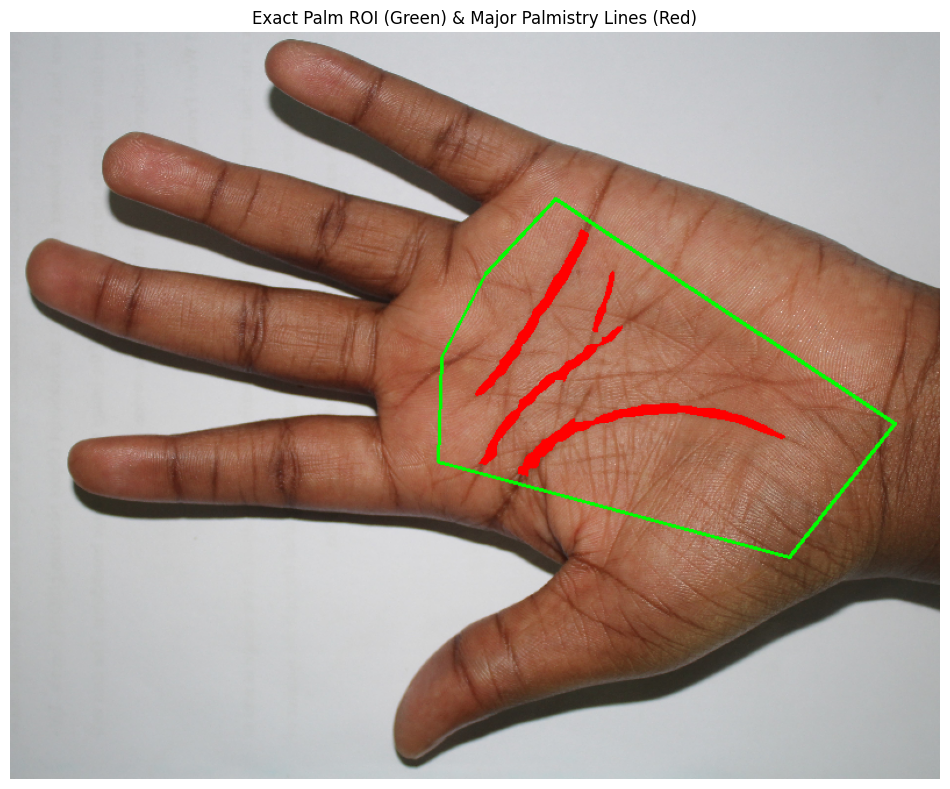

In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import mediapipe.python.solutions.hands as mp_hands

def extract_major_palmistry_lines(image_path, max_dim=800, min_line_length=80):
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image.")
        return
        
    # 1. Resize Image for consistency
    H, W = img.shape[:2]
    if max(H, W) > max_dim:
        scale = max_dim / float(max(H, W))
        img = cv2.resize(img, (int(W * scale), int(H * scale)))
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # --- STEP 1: EXACT PALM ROI USING MEDIAPIPE ---
    
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
    results = hands.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    palm_mask = np.zeros_like(gray)
    pts = None
    
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            # 0: Wrist, 1: Thumb Base, 5: Index Base, 9: Middle Base, 13: Ring Base, 17: Pinky Base
            h, w = img.shape[:2]
            palm_points = [0, 1, 5, 9, 13, 17]
            pts_list = []
            
            for idx in palm_points:
                lm = hand_landmarks.landmark[idx]
                pts_list.append([int(lm.x * w), int(lm.y * h)])
                
            # Create a polygon mask strictly for the inner palm
            pts = np.array(pts_list, dtype=np.int32)
            cv2.fillPoly(palm_mask, [pts], 255)
            
            # Erode the mask slightly to keep away from the shadowed edges of the hand
            palm_mask = cv2.erode(palm_mask, np.ones((15, 15), np.uint8), iterations=1)
    else:
        print("MediaPipe could not detect hand landmarks. Please check image orientation.")
        return
        
    hands.close()

    # --- STEP 2: SKIN DENOISING ---
    # Bilateral filtering smooths flat skin texture (pores) while preserving sharp, deep lines
    smoothed = cv2.bilateralFilter(gray, d=9, sigmaColor=75, sigmaSpace=75)

    # --- STEP 3: LINE EXTRACTION ---
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(smoothed)

    # Black-Hat isolates dark valley structures (creases)
    kernel_size = 17 
    line_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, line_kernel)

    # Strict threshold to binarize the lines
    _, binary_lines = cv2.threshold(blackhat, 28, 255, cv2.THRESH_BINARY)
    
    # Mask out the background and fingers
    palm_only_lines = cv2.bitwise_and(binary_lines, binary_lines, mask=palm_mask)

    # --- STEP 4: FILTER BY LINE LENGTH (Erase tiny wrinkles) ---
    clean_lines_mask = np.zeros_like(gray)
    contours, _ = cv2.findContours(palm_only_lines, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        # Calculate the physical length of the line segment
        length = cv2.arcLength(cnt, closed=False)
        area = cv2.contourArea(cnt)
        
        # Only keep the contour if it is long enough to be a principal palmistry line
        if length > min_line_length and area > 5:
            cv2.drawContours(clean_lines_mask, [cnt], -1, 255, thickness=cv2.FILLED)
            
    # Connect slightly broken segments of the major lines back together
    clean_lines_mask = cv2.morphologyEx(clean_lines_mask, cv2.MORPH_CLOSE, np.ones((7, 7), np.uint8))

    # --- STEP 5: VISUALIZATION ---
    output_vis = img.copy()
    
    # Draw Palm Boundary (Green)
    if pts is not None:
        cv2.polylines(output_vis, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
        
    # Draw the Major Palmistry Lines (Red)
    output_vis[clean_lines_mask == 255] = [0, 0, 255] 
    output_vis_rgb = cv2.cvtColor(output_vis, cv2.COLOR_BGR2RGB)

    # Display in Kaggle
    plt.figure(figsize=(12, 12))
    plt.imshow(output_vis_rgb)
    plt.title("Exact Palm ROI (Green) & Major Palmistry Lines (Red)")
    plt.axis("off")
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    img_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0004.JPG" # Reference your verbatim file name here
    
    # You can tweak min_line_length. Higher numbers delete more wrinkles but might break major lines.
    extract_major_palmistry_lines(img_path, min_line_length=80)

W0000 00:00:1784625701.343587     544 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1784625701.359261     544 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


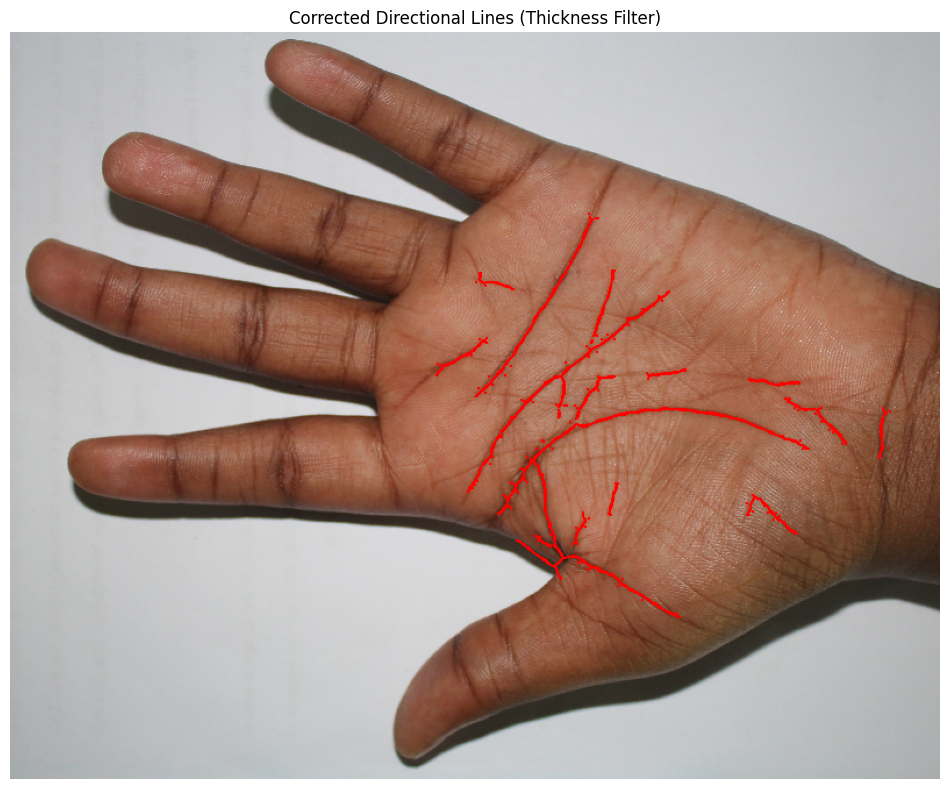

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import mediapipe.python.solutions.hands as mp_hands 

def extract_major_palmistry_lines(image_path, max_dim=800, min_line_length=60):
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image.")
        return
        
    # 1. Resize Image for consistency
    H, W = img.shape[:2]
    if max(H, W) > max_dim:
        scale = max_dim / float(max(H, W))
        img = cv2.resize(img, (int(W * scale), int(H * scale)))
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # --- STEP 1: PRECISE PALM ROI ---
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
    results = hands.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    palm_mask = np.zeros_like(gray)
    
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            h, w = img.shape[:2]
            inner_palm_points = [0, 1, 2, 5, 9, 13, 17] 
            pts_list = []
            
            for idx in inner_palm_points:
                lm = hand_landmarks.landmark[idx]
                pts_list.append([int(lm.x * w), int(lm.y * h)])
                
            pts = np.array(pts_list, dtype=np.int32)
            cv2.fillPoly(palm_mask, [pts], 255)
            # Gentle dilation to catch lines near the edge of the palm
            palm_mask = cv2.dilate(palm_mask, np.ones((10, 10), np.uint8), iterations=1)
    else:
        print("MediaPipe could not detect hand landmarks.")
        return
        
    hands.close()

    # --- STEP 2: HIGHLIGHT VALLEYS (CREASES) ---
    smoothed = cv2.bilateralFilter(gray, d=9, sigmaColor=75, sigmaSpace=75)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(smoothed)

    kernel_size = 15 
    line_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, line_kernel)

    # Binarize with a moderate threshold to catch major lines but leave out skin pores
    _, binary_lines = cv2.threshold(blackhat, 18, 255, cv2.THRESH_BINARY)
    palm_only_lines = cv2.bitwise_and(binary_lines, binary_lines, mask=palm_mask)

    # --- STEP 3: SHAPE-BASED FILTERING (THICKNESS INSTEAD OF ASPECT RATIO) ---
    clean_lines_mask = np.zeros_like(gray)
    contours, _ = cv2.findContours(palm_only_lines, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        length = cv2.arcLength(cnt, closed=False)
        area = cv2.contourArea(cnt)
        
        if length > min_line_length:
            # Estimate average line thickness (Area / Length)
            thickness = area / length if length > 0 else 100
            
            # Keep the contour ONLY if its average thickness is less than 6.5 pixels
            if thickness < 6.5:
                cv2.drawContours(clean_lines_mask, [cnt], -1, 255, thickness=cv2.FILLED)
                
    # Close small broken gaps in the lines
    clean_lines_mask = cv2.morphologyEx(clean_lines_mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))

    # --- Standard OpenCV Skeletonization (To make lines 1-pixel wide like a chart) ---
    skeleton = np.zeros_like(clean_lines_mask)
    temp_img = clean_lines_mask.copy()
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    
    while True:
        eroded = cv2.erode(temp_img, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(temp_img, temp)
        skeleton = cv2.bitwise_or(skeleton, temp)
        temp_img = eroded.copy()
        if cv2.countNonZero(temp_img) == 0:
            break
            
    # Re-thicken slightly just so they show up clearly on the plot
    clean_lines_mask = cv2.dilate(skeleton, np.ones((2, 2), np.uint8), iterations=1)

    # --- STEP 4: VISUALIZATION ---
    output_vis = img.copy()
    output_vis[clean_lines_mask > 0] = [0, 0, 255] 
    output_vis_rgb = cv2.cvtColor(output_vis, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 12))
    plt.imshow(output_vis_rgb)
    plt.title("Corrected Directional Lines (Thickness Filter)")
    plt.axis("off")
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    img_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0004.JPG" # Make sure your path matches Kaggle verbatim
    
    extract_major_palmistry_lines(img_path, min_line_length=60)

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1784635585.265362     159 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1784635585.297620     159 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


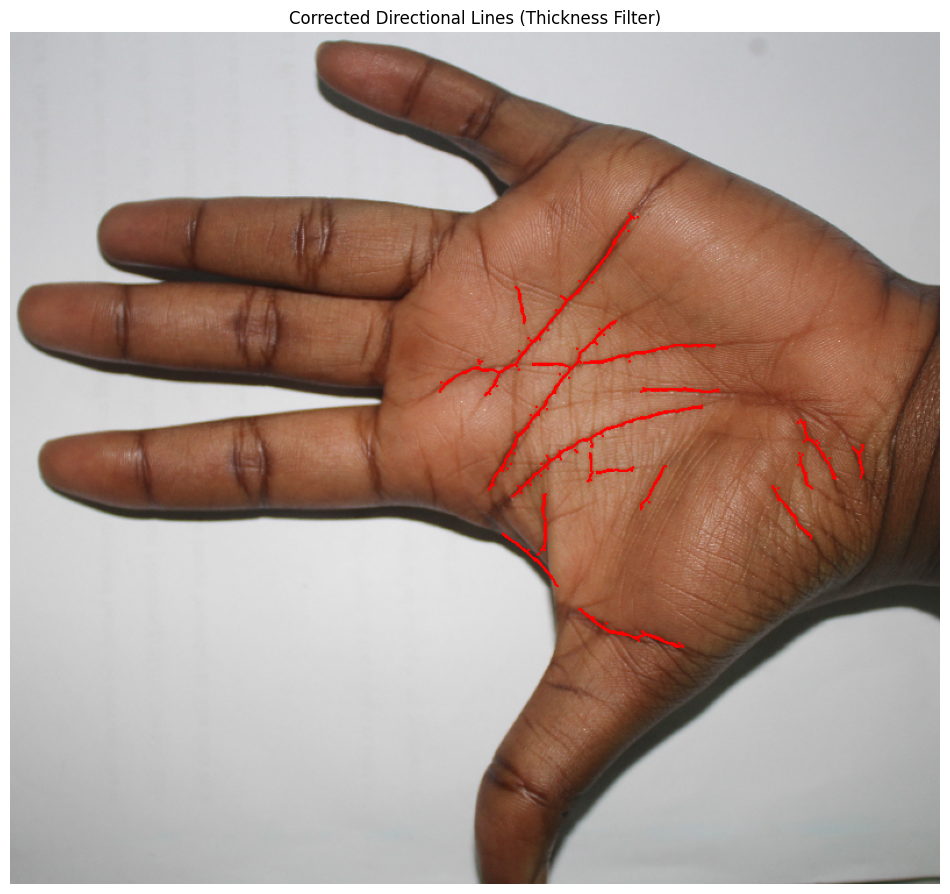

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import mediapipe.python.solutions.hands as mp_hands 

def extract_major_palmistry_lines(image_path, max_dim=800, min_line_length=60):
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image.")
        return
        
    # 1. Resize Image for consistency
    H, W = img.shape[:2]
    if max(H, W) > max_dim:
        scale = max_dim / float(max(H, W))
        img = cv2.resize(img, (int(W * scale), int(H * scale)))
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # --- STEP 1: PRECISE PALM ROI ---
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
    results = hands.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    palm_mask = np.zeros_like(gray)
    
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            h, w = img.shape[:2]
            inner_palm_points = [0, 1, 2, 5, 9, 13, 17] 
            pts_list = []
            
            for idx in inner_palm_points:
                lm = hand_landmarks.landmark[idx]
                pts_list.append([int(lm.x * w), int(lm.y * h)])
                
            pts = np.array(pts_list, dtype=np.int32)
            cv2.fillPoly(palm_mask, [pts], 255)
            # Gentle dilation to catch lines near the edge of the palm
            palm_mask = cv2.dilate(palm_mask, np.ones((10, 10), np.uint8), iterations=1)
    else:
        print("MediaPipe could not detect hand landmarks.")
        return
        
    hands.close()

    # --- STEP 2: HIGHLIGHT VALLEYS (CREASES) ---
    smoothed = cv2.bilateralFilter(gray, d=9, sigmaColor=75, sigmaSpace=75)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(smoothed)

    kernel_size = 15 
    line_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, line_kernel)

    # Binarize with a moderate threshold to catch major lines but leave out skin pores
    _, binary_lines = cv2.threshold(blackhat, 18, 255, cv2.THRESH_BINARY)
    palm_only_lines = cv2.bitwise_and(binary_lines, binary_lines, mask=palm_mask)

    # --- STEP 3: SHAPE-BASED FILTERING (THICKNESS INSTEAD OF ASPECT RATIO) ---
    clean_lines_mask = np.zeros_like(gray)
    contours, _ = cv2.findContours(palm_only_lines, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        length = cv2.arcLength(cnt, closed=False)
        area = cv2.contourArea(cnt)
        
        if length > min_line_length:
            # Estimate average line thickness (Area / Length)
            thickness = area / length if length > 0 else 100
            
            # Keep the contour ONLY if its average thickness is less than 6.5 pixels
            if thickness < 6.5:
                cv2.drawContours(clean_lines_mask, [cnt], -1, 255, thickness=cv2.FILLED)
                
    # Close small broken gaps in the lines
    clean_lines_mask = cv2.morphologyEx(clean_lines_mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))

    # --- Standard OpenCV Skeletonization (To make lines 1-pixel wide like a chart) ---
    skeleton = np.zeros_like(clean_lines_mask)
    temp_img = clean_lines_mask.copy()
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    
    while True:
        eroded = cv2.erode(temp_img, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(temp_img, temp)
        skeleton = cv2.bitwise_or(skeleton, temp)
        temp_img = eroded.copy()
        if cv2.countNonZero(temp_img) == 0:
            break
            
    # Re-thicken slightly just so they show up clearly on the plot
    clean_lines_mask = cv2.dilate(skeleton, np.ones((2, 2), np.uint8), iterations=1)

    # --- STEP 4: VISUALIZATION ---
    output_vis = img.copy()
    output_vis[clean_lines_mask > 0] = [0, 0, 255] 
    output_vis_rgb = cv2.cvtColor(output_vis, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 12))
    plt.imshow(output_vis_rgb)
    plt.title("Corrected Directional Lines (Thickness Filter)")
    plt.axis("off")
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    img_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG" # Make sure your path matches Kaggle verbatim
    
    extract_major_palmistry_lines(img_path, min_line_length=60)

W0000 00:00:1784636023.000939     176 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1784636023.018962     176 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


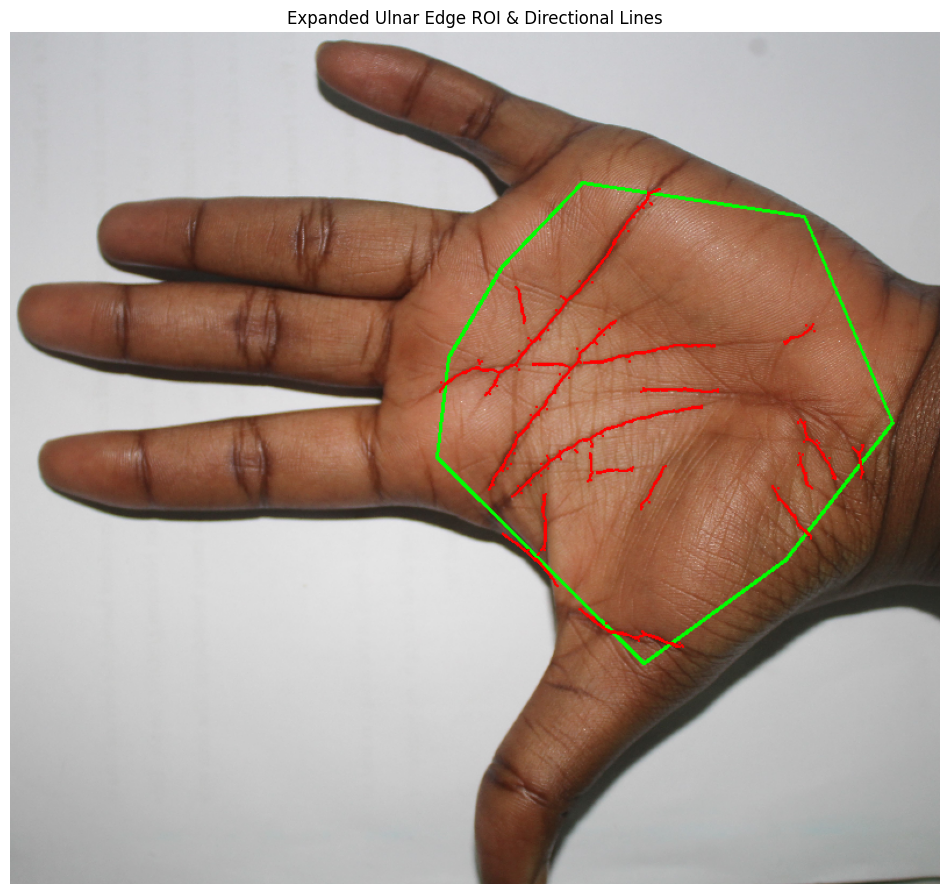

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import mediapipe.python.solutions.hands as mp_hands 

def extract_major_palmistry_lines(image_path, max_dim=800, min_line_length=60):
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image.")
        return
        
    # 1. Resize Image for consistency
    H, W = img.shape[:2]
    if max(H, W) > max_dim:
        scale = max_dim / float(max(H, W))
        img = cv2.resize(img, (int(W * scale), int(H * scale)))
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # --- STEP 1: PRECISE PALM ROI WITH EXPANDED OUTER EDGE ---
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
    results = hands.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    palm_mask = np.zeros_like(gray)
    pts = None
    
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            h, w = img.shape[:2]
            
            # Helper function to grab points easily
            def get_pt(idx):
                return np.array([hand_landmarks.landmark[idx].x * w, hand_landmarks.landmark[idx].y * h])

            pt0 = get_pt(0)   # Wrist
            pt1 = get_pt(1)   # Thumb base
            pt2 = get_pt(2)   # Thumb mid
            pt5 = get_pt(5)   # Index base
            pt9 = get_pt(9)   # Middle base
            pt13 = get_pt(13) # Ring base
            pt17 = get_pt(17) # Pinky base
            
            # --- NEW MATH: Bow out the edge between Pinky (17) and Wrist (0) ---
            # 1. Find the exact midpoint between the wrist and pinky base
            mid_0_17 = (pt0 + pt17) / 2.0
            
            # 2. Get the directional vector from 0 to 17, and create a perpendicular vector
            vec_0_17 = pt17 - pt0
            perp_vec = np.array([-vec_0_17[1], vec_0_17[0]])
            perp_vec = perp_vec / (np.linalg.norm(perp_vec) + 1e-6) # Normalize to length 1
            
            # 3. Ensure it points OUTWARD (away from the center of the hand)
            vec_17_5 = pt5 - pt17 # Vector pointing inward toward index finger
            if np.dot(perp_vec, vec_17_5) > 0:
                perp_vec = -perp_vec # Flip direction if it accidentally points inward
                
            # 4. Push the new point out by 35% of the hand's total width
            hand_width = np.linalg.norm(pt5 - pt17)
            outer_pt = mid_0_17 + perp_vec * (hand_width * 0.35)
            
            # Build the polygon array around the palm, including our new outer point
            pts_list = [pt0, pt1, pt2, pt5, pt9, pt13, pt17, outer_pt]
            pts = np.array(pts_list, dtype=np.int32)
            
            cv2.fillPoly(palm_mask, [pts], 255)
            
            # Gentle dilation to catch lines right on the border
            palm_mask = cv2.dilate(palm_mask, np.ones((10, 10), np.uint8), iterations=1)
    else:
        print("MediaPipe could not detect hand landmarks.")
        return
        
    hands.close()

    # --- STEP 2: HIGHLIGHT VALLEYS (CREASES) ---
    smoothed = cv2.bilateralFilter(gray, d=9, sigmaColor=75, sigmaSpace=75)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(smoothed)

    kernel_size = 15 
    line_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, line_kernel)

    _, binary_lines = cv2.threshold(blackhat, 18, 255, cv2.THRESH_BINARY)
    palm_only_lines = cv2.bitwise_and(binary_lines, binary_lines, mask=palm_mask)

    # --- STEP 3: SHAPE-BASED FILTERING (THICKNESS) ---
    clean_lines_mask = np.zeros_like(gray)
    contours, _ = cv2.findContours(palm_only_lines, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        length = cv2.arcLength(cnt, closed=False)
        area = cv2.contourArea(cnt)
        
        if length > min_line_length:
            thickness = area / length if length > 0 else 100
            
            if thickness < 6.5:
                cv2.drawContours(clean_lines_mask, [cnt], -1, 255, thickness=cv2.FILLED)
                
    clean_lines_mask = cv2.morphologyEx(clean_lines_mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))

    # --- Standard OpenCV Skeletonization ---
    skeleton = np.zeros_like(clean_lines_mask)
    temp_img = clean_lines_mask.copy()
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    
    while True:
        eroded = cv2.erode(temp_img, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(temp_img, temp)
        skeleton = cv2.bitwise_or(skeleton, temp)
        temp_img = eroded.copy()
        if cv2.countNonZero(temp_img) == 0:
            break
            
    clean_lines_mask = cv2.dilate(skeleton, np.ones((2, 2), np.uint8), iterations=1)

    # --- STEP 4: VISUALIZATION ---
    output_vis = img.copy()
    
    # Optional: Draw the newly expanded green polygon so you can verify it covers the whole palm!
    if pts is not None:
        cv2.polylines(output_vis, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
        
    output_vis[clean_lines_mask > 0] = [0, 0, 255] 
    output_vis_rgb = cv2.cvtColor(output_vis, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 12))
    plt.imshow(output_vis_rgb)
    plt.title("Expanded Ulnar Edge ROI & Directional Lines")
    plt.axis("off")
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    img_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG" # Make sure your path matches Kaggle verbatim
    
    extract_major_palmistry_lines(img_path, min_line_length=60)

W0000 00:00:1784636333.718712     191 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1784636333.734700     191 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


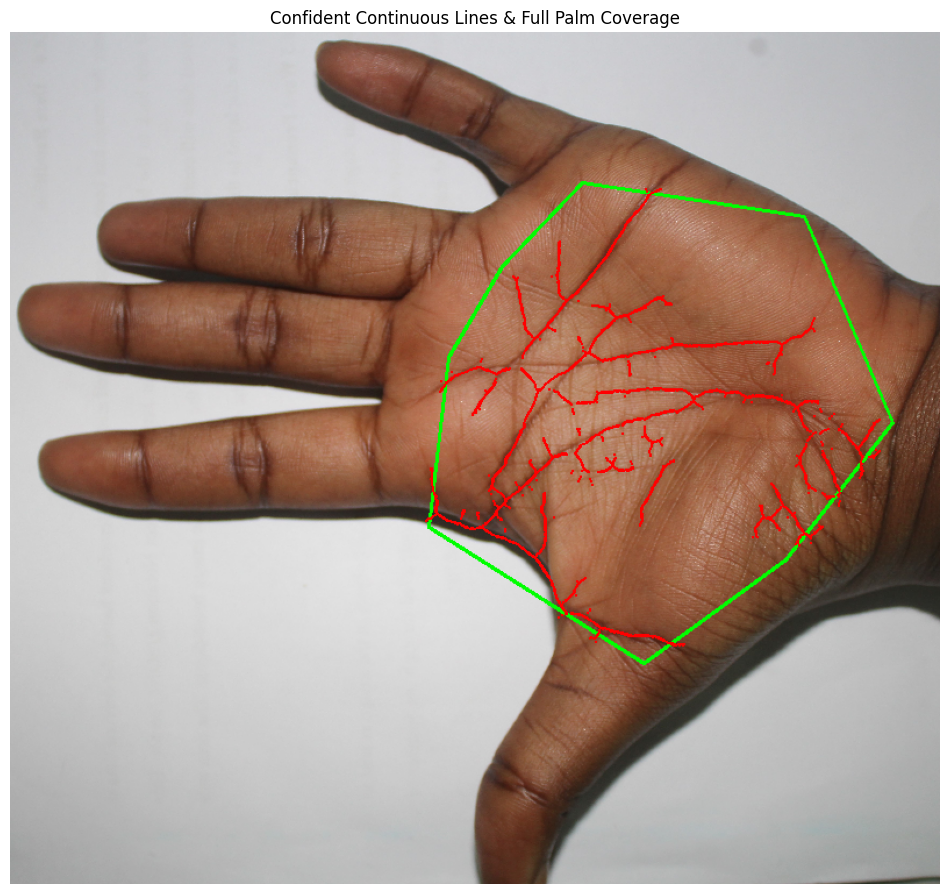

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import mediapipe.python.solutions.hands as mp_hands 

def extract_major_palmistry_lines(image_path, max_dim=800, min_line_length=80):
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image.")
        return
        
    # 1. Resize Image for consistency
    H, W = img.shape[:2]
    if max(H, W) > max_dim:
        scale = max_dim / float(max(H, W))
        img = cv2.resize(img, (int(W * scale), int(H * scale)))
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # --- STEP 1: PRECISE PALM ROI WITH ALL EDGES EXPANDED ---
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
    results = hands.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    palm_mask = np.zeros_like(gray)
    pts = None
    
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            h, w = img.shape[:2]
            
            def get_pt(idx):
                return np.array([hand_landmarks.landmark[idx].x * w, hand_landmarks.landmark[idx].y * h])

            pt0 = get_pt(0); pt1 = get_pt(1); pt2 = get_pt(2)
            pt5 = get_pt(5); pt9 = get_pt(9); pt13 = get_pt(13); pt17 = get_pt(17)
            
            # 1. EXPAND ULNAR EDGE (Pinky Side)
            mid_0_17 = (pt0 + pt17) / 2.0
            vec_0_17 = pt17 - pt0
            perp_vec = np.array([-vec_0_17[1], vec_0_17[0]])
            perp_vec = perp_vec / (np.linalg.norm(perp_vec) + 1e-6)
            if np.dot(perp_vec, pt5 - pt17) > 0: perp_vec = -perp_vec 
            hand_width = np.linalg.norm(pt5 - pt17)
            outer_ulnar_pt = mid_0_17 + perp_vec * (hand_width * 0.35)
            
            # 2. EXPAND RADIAL EDGE (Thumb/Index Webbing - Your Yellow Circle!)
            # We calculate the vector from the middle finger to the index finger, 
            # and push the boundary out further in that exact direction.
            vec_9_to_5 = pt5 - pt9
            outer_jupiter_pt = pt5 + vec_9_to_5 * 0.7 
            
            # Build the newly expanded polygon
            pts_list = [pt0, pt1, pt2, outer_jupiter_pt, pt9, pt13, pt17, outer_ulnar_pt]
            pts = np.array(pts_list, dtype=np.int32)
            
            cv2.fillPoly(palm_mask, [pts], 255)
            palm_mask = cv2.dilate(palm_mask, np.ones((10, 10), np.uint8), iterations=1)
    else:
        print("MediaPipe could not detect hand landmarks.")
        return
        
    hands.close()

    # --- STEP 2: HIGHLIGHT VALLEYS (CREASES) ---
    smoothed = cv2.bilateralFilter(gray, d=9, sigmaColor=75, sigmaSpace=75)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(smoothed)

    # Use a slightly larger kernel to capture the wider, deeper parts of the major lines
    line_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, line_kernel)

    # Blur slightly so dashed lines bleed into each other, then threshold
    blurred_blackhat = cv2.GaussianBlur(blackhat, (3, 3), 0)
    _, binary_lines = cv2.threshold(blurred_blackhat, 12, 255, cv2.THRESH_BINARY)
    palm_only_lines = cv2.bitwise_and(binary_lines, binary_lines, mask=palm_mask)

    # --- STEP 3: BRIDGE GAPS *BEFORE* FILTERING ---
    # This connects the broken dashed lines into one solid, confident line
    bridge_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
    connected_lines = cv2.morphologyEx(palm_only_lines, cv2.MORPH_CLOSE, bridge_kernel)

    # --- STEP 4: SHAPE-BASED FILTERING ---
    clean_lines_mask = np.zeros_like(gray)
    contours, _ = cv2.findContours(connected_lines, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        length = cv2.arcLength(cnt, closed=False)
        area = cv2.contourArea(cnt)
        
        # Now that lines are connected, we can confidently filter out the short, messy wrinkles
        if length > min_line_length:
            # We relax the thickness check slightly to account for the bridging we just did
            thickness = area / length if length > 0 else 100
            if thickness < 12.0: 
                cv2.drawContours(clean_lines_mask, [cnt], -1, 255, thickness=cv2.FILLED)
                
    # --- Standard OpenCV Skeletonization ---
    skeleton = np.zeros_like(clean_lines_mask)
    temp_img = clean_lines_mask.copy()
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    
    while True:
        eroded = cv2.erode(temp_img, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(temp_img, temp)
        skeleton = cv2.bitwise_or(skeleton, temp)
        temp_img = eroded.copy()
        if cv2.countNonZero(temp_img) == 0:
            break
            
    # Thicken slightly so the lines are highly visible and solid
    clean_lines_mask = cv2.dilate(skeleton, np.ones((2, 2), np.uint8), iterations=1)

    # --- STEP 5: VISUALIZATION ---
    output_vis = img.copy()
    
    # Draw the newly expanded green polygon
    if pts is not None:
        cv2.polylines(output_vis, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
        
    output_vis[clean_lines_mask > 0] = [0, 0, 255] 
    output_vis_rgb = cv2.cvtColor(output_vis, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 12))
    plt.imshow(output_vis_rgb)
    plt.title("Confident Continuous Lines & Full Palm Coverage")
    plt.axis("off")
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    img_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG" # Make sure your path matches Kaggle verbatim
    
    # We can increase min_line_length back up because the lines are now properly connected!
    extract_major_palmistry_lines(img_path, min_line_length=80)

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
W0000 00:00:1784986725.690562     193 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1784986725.724521     191 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
/usr/local/lib/python3.12/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


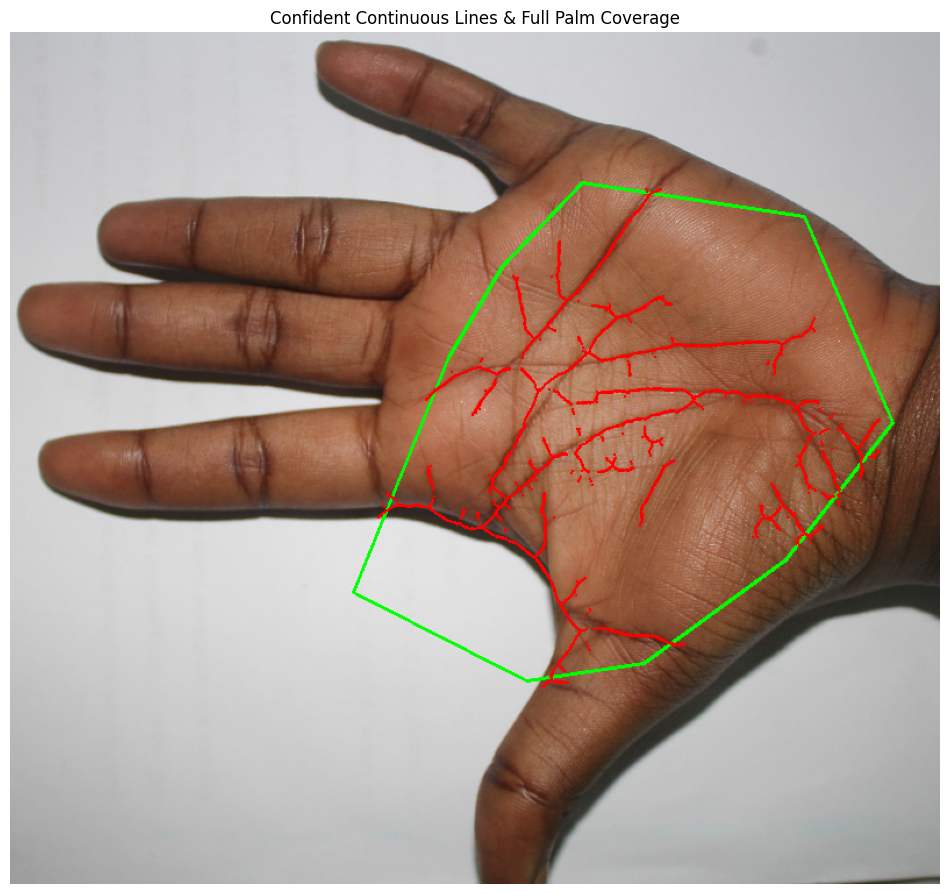

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import mediapipe.python.solutions.hands as mp_hands 

def extract_major_palmistry_lines(image_path, max_dim=800, min_line_length=80):
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image.")
        return
        
    # 1. Resize Image for consistency
    H, W = img.shape[:2]
    if max(H, W) > max_dim:
        scale = max_dim / float(max(H, W))
        img = cv2.resize(img, (int(W * scale), int(H * scale)))
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # --- STEP 1: PRECISE PALM ROI WITH ALL EDGES EXPANDED ---
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
    results = hands.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    palm_mask = np.zeros_like(gray)
    pts = None
    
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            h, w = img.shape[:2]
            
            def get_pt(idx):
                return np.array([hand_landmarks.landmark[idx].x * w, hand_landmarks.landmark[idx].y * h])

            pt0 = get_pt(0); pt1 = get_pt(1); pt2 = get_pt(2)
            pt5 = get_pt(5); pt9 = get_pt(9); pt13 = get_pt(13); pt17 = get_pt(17)
            
            # 1. EXPAND ULNAR EDGE (Pinky Side)
            mid_0_17 = (pt0 + pt17) / 2.0
            vec_0_17 = pt17 - pt0
            perp_vec = np.array([-vec_0_17[1], vec_0_17[0]])
            perp_vec = perp_vec / (np.linalg.norm(perp_vec) + 1e-6)
            if np.dot(perp_vec, pt5 - pt17) > 0: perp_vec = -perp_vec 
            hand_width = np.linalg.norm(pt5 - pt17)
            outer_ulnar_pt = mid_0_17 + perp_vec * (hand_width * 0.35)
            
            # 2. EXPAND RADIAL EDGE (Thumb/Index Webbing - The Yellow Circle!)
            vec_9_to_5 = pt5 - pt9
            vec_0_to_5 = pt5 - pt0 # Vector pointing up the hand
            
            # Push index corner much further out (1.3) and slightly up (0.15)
            outer_jupiter_pt = pt5 + vec_9_to_5 * 1.3 + vec_0_to_5 * 0.15 
            
            # Create a new outward point for the webbing to avoid a straight cut
            mid_2_5 = (pt2 + pt5) / 2.0
            outer_web_pt = mid_2_5 + vec_9_to_5 * 1.2
            
            # Build the newly expanded polygon (Added outer_web_pt)
            pts_list = [pt0, pt1, pt2, outer_web_pt, outer_jupiter_pt, pt9, pt13, pt17, outer_ulnar_pt]
            pts = np.array(pts_list, dtype=np.int32)
            
            cv2.fillPoly(palm_mask, [pts], 255)
            palm_mask = cv2.dilate(palm_mask, np.ones((10, 10), np.uint8), iterations=1)
    else:
        print("MediaPipe could not detect hand landmarks.")
        return
        
    hands.close()

    # --- STEP 2: HIGHLIGHT VALLEYS (CREASES) ---
    smoothed = cv2.bilateralFilter(gray, d=9, sigmaColor=75, sigmaSpace=75)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(smoothed)

    line_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, line_kernel)

    blurred_blackhat = cv2.GaussianBlur(blackhat, (3, 3), 0)
    _, binary_lines = cv2.threshold(blurred_blackhat, 12, 255, cv2.THRESH_BINARY)
    palm_only_lines = cv2.bitwise_and(binary_lines, binary_lines, mask=palm_mask)

    # --- STEP 3: BRIDGE GAPS *BEFORE* FILTERING ---
    bridge_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
    connected_lines = cv2.morphologyEx(palm_only_lines, cv2.MORPH_CLOSE, bridge_kernel)

    # --- STEP 4: SHAPE-BASED FILTERING ---
    clean_lines_mask = np.zeros_like(gray)
    contours, _ = cv2.findContours(connected_lines, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        length = cv2.arcLength(cnt, closed=False)
        area = cv2.contourArea(cnt)
        
        if length > min_line_length:
            thickness = area / length if length > 0 else 100
            if thickness < 12.0: 
                cv2.drawContours(clean_lines_mask, [cnt], -1, 255, thickness=cv2.FILLED)
                
    # --- Standard OpenCV Skeletonization ---
    skeleton = np.zeros_like(clean_lines_mask)
    temp_img = clean_lines_mask.copy()
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    
    while True:
        eroded = cv2.erode(temp_img, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(temp_img, temp)
        skeleton = cv2.bitwise_or(skeleton, temp)
        temp_img = eroded.copy()
        if cv2.countNonZero(temp_img) == 0:
            break
            
    clean_lines_mask = cv2.dilate(skeleton, np.ones((2, 2), np.uint8), iterations=1)

    # --- STEP 5: VISUALIZATION ---
    output_vis = img.copy()
    
    if pts is not None:
        cv2.polylines(output_vis, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
        
    output_vis[clean_lines_mask > 0] = [0, 0, 255] 
    output_vis_rgb = cv2.cvtColor(output_vis, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 12))
    plt.imshow(output_vis_rgb)
    plt.title("Confident Continuous Lines & Full Palm Coverage")
    plt.axis("off")
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    img_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG"
    extract_major_palmistry_lines(img_path, min_line_length=80)

In [3]:
import tensorflow as tf
import google.protobuf

print(tf.__version__)
print(google.protobuf.__version__)

2.20.0
5.29.5


W0000 00:00:1784987441.085569     213 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1784987441.115180     213 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


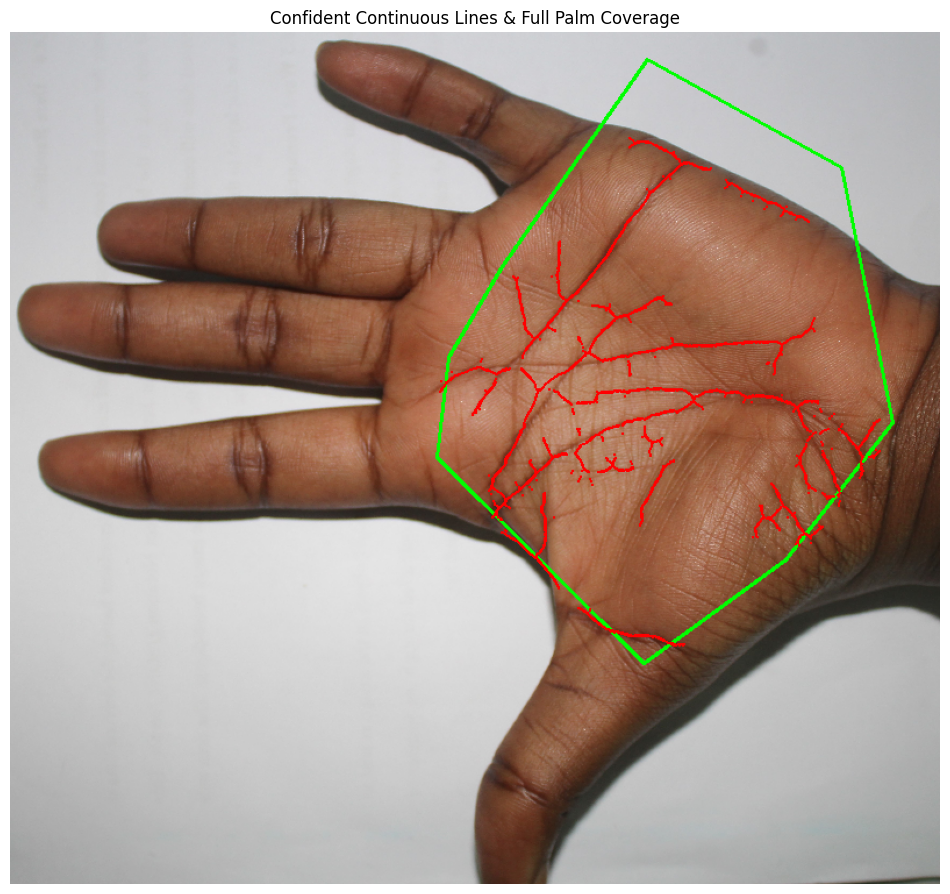

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import mediapipe.python.solutions.hands as mp_hands 

def extract_major_palmistry_lines(image_path, max_dim=800, min_line_length=80):
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image.")
        return
        
    # 1. Resize Image for consistency
    H, W = img.shape[:2]
    if max(H, W) > max_dim:
        scale = max_dim / float(max(H, W))
        img = cv2.resize(img, (int(W * scale), int(H * scale)))
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # --- STEP 1: PRECISE PALM ROI WITH ALL EDGES EXPANDED ---
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
    results = hands.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    palm_mask = np.zeros_like(gray)
    pts = None
    
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            h, w = img.shape[:2]
            
            def get_pt(idx):
                return np.array([hand_landmarks.landmark[idx].x * w, hand_landmarks.landmark[idx].y * h])

            pt0 = get_pt(0); pt1 = get_pt(1); pt2 = get_pt(2)
            pt5 = get_pt(5); pt9 = get_pt(9); pt13 = get_pt(13); pt17 = get_pt(17)

            # --- STANDARD THUMB/INDEX EDGE (Reverted to normal) ---
            # We skip the extreme expansions and just use the natural hand landmarks
            # pt0 (wrist) -> pt1, pt2 (thumb base) -> pt5 (index base)

            # --- EXPAND PINKY / ULNAR EDGE ---
            # 1. Expand the middle of the outer edge (pushed out further than before)
            mid_0_17 = (pt0 + pt17) / 2.0
            vec_0_17 = pt17 - pt0
            perp_vec = np.array([-vec_0_17[1], vec_0_17[0]])
            perp_vec = perp_vec / (np.linalg.norm(perp_vec) + 1e-6)
            if np.dot(perp_vec, pt5 - pt17) > 0: perp_vec = -perp_vec 
            hand_width = np.linalg.norm(pt5 - pt17)
            
            # Increased multiplier from 0.35 to 0.55 to grab more of the outer palm
            outer_ulnar_pt = mid_0_17 + perp_vec * (hand_width * 0.55) 

            # 2. Expand the upper pinky webbing (New addition!)
            # Calculate vectors to push the pinky corner outward
            vec_13_to_17 = pt17 - pt13  # Vector from ring finger to pinky finger
            vec_0_to_17 = pt17 - pt0    # Vector from wrist to pinky finger
            
            # Push pinky corner outward (1.2x) and slightly up (0.1x)
            outer_pinky_pt = pt17 + vec_13_to_17 * 1.2 + vec_0_to_17 * 0.1

            # --- BUILD THE NEW POLYGON ---
            # We use pt5 for the normal thumb side, and outer_pinky_pt for the expanded pinky side
            pts_list = [pt0, pt1, pt2, pt5, pt9, pt13, outer_pinky_pt, outer_ulnar_pt]
            pts = np.array(pts_list, dtype=np.int32)
          
            
            cv2.fillPoly(palm_mask, [pts], 255)
            palm_mask = cv2.dilate(palm_mask, np.ones((10, 10), np.uint8), iterations=1)
    else:
        print("MediaPipe could not detect hand landmarks.")
        return
        
    hands.close()

    # --- STEP 2: HIGHLIGHT VALLEYS (CREASES) ---
    smoothed = cv2.bilateralFilter(gray, d=9, sigmaColor=75, sigmaSpace=75)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(smoothed)

    line_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, line_kernel)

    blurred_blackhat = cv2.GaussianBlur(blackhat, (3, 3), 0)
    _, binary_lines = cv2.threshold(blurred_blackhat, 12, 255, cv2.THRESH_BINARY)
    palm_only_lines = cv2.bitwise_and(binary_lines, binary_lines, mask=palm_mask)

    # --- STEP 3: BRIDGE GAPS *BEFORE* FILTERING ---
    bridge_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
    connected_lines = cv2.morphologyEx(palm_only_lines, cv2.MORPH_CLOSE, bridge_kernel)

    # --- STEP 4: SHAPE-BASED FILTERING ---
    clean_lines_mask = np.zeros_like(gray)
    contours, _ = cv2.findContours(connected_lines, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        length = cv2.arcLength(cnt, closed=False)
        area = cv2.contourArea(cnt)
        
        if length > min_line_length:
            thickness = area / length if length > 0 else 100
            if thickness < 12.0: 
                cv2.drawContours(clean_lines_mask, [cnt], -1, 255, thickness=cv2.FILLED)
                
    # --- Standard OpenCV Skeletonization ---
    skeleton = np.zeros_like(clean_lines_mask)
    temp_img = clean_lines_mask.copy()
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    
    while True:
        eroded = cv2.erode(temp_img, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(temp_img, temp)
        skeleton = cv2.bitwise_or(skeleton, temp)
        temp_img = eroded.copy()
        if cv2.countNonZero(temp_img) == 0:
            break
            
    clean_lines_mask = cv2.dilate(skeleton, np.ones((2, 2), np.uint8), iterations=1)

    # --- STEP 5: VISUALIZATION ---
    output_vis = img.copy()
    
    if pts is not None:
        cv2.polylines(output_vis, [pts], isClosed=True, color=(0, 255, 0), thickness=2)
        
    output_vis[clean_lines_mask > 0] = [0, 0, 255] 
    output_vis_rgb = cv2.cvtColor(output_vis, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 12))
    plt.imshow(output_vis_rgb)
    plt.title("Confident Continuous Lines & Full Palm Coverage")
    plt.axis("off")
    plt.show()

# --- Execution ---
if __name__ == "__main__":
    img_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG"
    extract_major_palmistry_lines(img_path, min_line_length=80)

W0000 00:00:1784988583.203576     228 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.
W0000 00:00:1784988583.216124     228 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


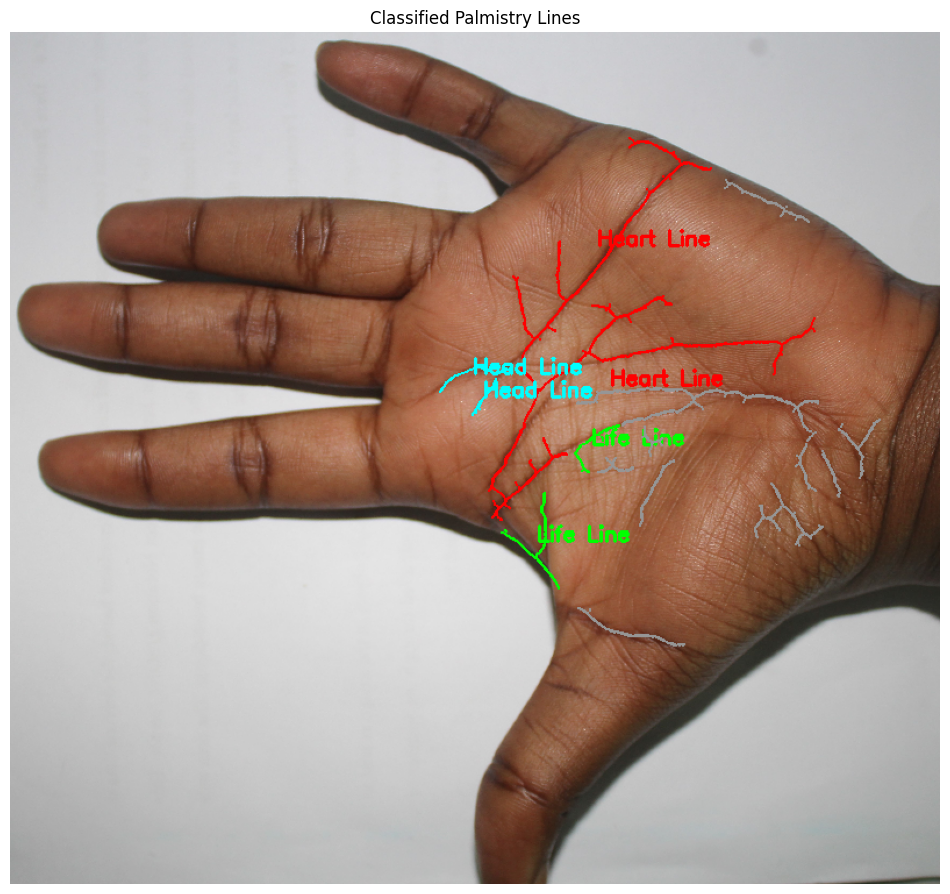

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import mediapipe as mp
import mediapipe.python.solutions.hands as mp_hands 

def extract_major_palmistry_lines(image_path, max_dim=800, min_line_length=80):
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image.")
        return
        
    # 1. Resize Image for consistency
    H, W = img.shape[:2]
    if max(H, W) > max_dim:
        scale = max_dim / float(max(H, W))
        img = cv2.resize(img, (int(W * scale), int(H * scale)))
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # --- STEP 1: PRECISE PALM ROI WITH ALL EDGES EXPANDED ---
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1, min_detection_confidence=0.5)
    results = hands.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    palm_mask = np.zeros_like(gray)
    pts = None
    
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            h, w = img.shape[:2]
            
            def get_pt(idx):
                return np.array([hand_landmarks.landmark[idx].x * w, hand_landmarks.landmark[idx].y * h])

            pt0 = get_pt(0); pt1 = get_pt(1); pt2 = get_pt(2)
            pt5 = get_pt(5); pt9 = get_pt(9); pt13 = get_pt(13); pt17 = get_pt(17)

            # --- STANDARD THUMB/INDEX EDGE (Reverted to normal) ---
            # We skip the extreme expansions and just use the natural hand landmarks
            # pt0 (wrist) -> pt1, pt2 (thumb base) -> pt5 (index base)

            # --- EXPAND PINKY / ULNAR EDGE ---
            # 1. Expand the middle of the outer edge (pushed out further than before)
            mid_0_17 = (pt0 + pt17) / 2.0
            vec_0_17 = pt17 - pt0
            perp_vec = np.array([-vec_0_17[1], vec_0_17[0]])
            perp_vec = perp_vec / (np.linalg.norm(perp_vec) + 1e-6)
            if np.dot(perp_vec, pt5 - pt17) > 0: perp_vec = -perp_vec 
            hand_width = np.linalg.norm(pt5 - pt17)
            
            # Increased multiplier from 0.35 to 0.55 to grab more of the outer palm
            outer_ulnar_pt = mid_0_17 + perp_vec * (hand_width * 0.55) 

            # 2. Expand the upper pinky webbing (New addition!)
            # Calculate vectors to push the pinky corner outward
            vec_13_to_17 = pt17 - pt13  # Vector from ring finger to pinky finger
            vec_0_to_17 = pt17 - pt0    # Vector from wrist to pinky finger
            
            # Push pinky corner outward (1.2x) and slightly up (0.1x)
            outer_pinky_pt = pt17 + vec_13_to_17 * 1.2 + vec_0_to_17 * 0.1

            # --- BUILD THE NEW POLYGON ---
            # We use pt5 for the normal thumb side, and outer_pinky_pt for the expanded pinky side
            pts_list = [pt0, pt1, pt2, pt5, pt9, pt13, outer_pinky_pt, outer_ulnar_pt]
            pts = np.array(pts_list, dtype=np.int32)
          
            
            cv2.fillPoly(palm_mask, [pts], 255)
            palm_mask = cv2.dilate(palm_mask, np.ones((10, 10), np.uint8), iterations=1)
    else:
        print("MediaPipe could not detect hand landmarks.")
        return
        
    hands.close()

    # --- STEP 2: HIGHLIGHT VALLEYS (CREASES) ---
    smoothed = cv2.bilateralFilter(gray, d=9, sigmaColor=75, sigmaSpace=75)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(smoothed)

    line_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))
    blackhat = cv2.morphologyEx(enhanced, cv2.MORPH_BLACKHAT, line_kernel)

    blurred_blackhat = cv2.GaussianBlur(blackhat, (3, 3), 0)
    _, binary_lines = cv2.threshold(blurred_blackhat, 12, 255, cv2.THRESH_BINARY)
    palm_only_lines = cv2.bitwise_and(binary_lines, binary_lines, mask=palm_mask)

    # --- STEP 3: BRIDGE GAPS *BEFORE* FILTERING ---
    bridge_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (9, 9))
    connected_lines = cv2.morphologyEx(palm_only_lines, cv2.MORPH_CLOSE, bridge_kernel)

    # --- STEP 4: SHAPE-BASED FILTERING ---
    clean_lines_mask = np.zeros_like(gray)
    contours, _ = cv2.findContours(connected_lines, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    
    for cnt in contours:
        length = cv2.arcLength(cnt, closed=False)
        area = cv2.contourArea(cnt)
        
        if length > min_line_length:
            thickness = area / length if length > 0 else 100
            if thickness < 12.0: 
                cv2.drawContours(clean_lines_mask, [cnt], -1, 255, thickness=cv2.FILLED)
                
    # --- Standard OpenCV Skeletonization ---
    skeleton = np.zeros_like(clean_lines_mask)
    temp_img = clean_lines_mask.copy()
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    
    while True:
        eroded = cv2.erode(temp_img, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(temp_img, temp)
        skeleton = cv2.bitwise_or(skeleton, temp)
        temp_img = eroded.copy()
        if cv2.countNonZero(temp_img) == 0:
            break
            
    clean_lines_mask = cv2.dilate(skeleton, np.ones((2, 2), np.uint8), iterations=1)

    # --- STEP 5: SEPARATE AND CLASSIFY LINES ---
    # Find individual line segments using Connected Components
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(clean_lines_mask, connectivity=8)
    
    output_vis = img.copy()
    
    # Define colors for our identified lines
    colors = {
        "Life Line": (0, 255, 0),    # Green
        "Heart Line": (0, 0, 255),   # Red
        "Head Line": (255, 255, 0),  # Cyan
        "Unknown": (150, 150, 150)   # Gray
    }

    # Helper function to find the closest MediaPipe point to a line segment
    def get_closest_landmark(line_pts, target_pt):
        distances = np.linalg.norm(line_pts - target_pt, axis=1)
        return np.min(distances)

    for i in range(1, num_labels): # Skip 0 (background)
        # Only process lines that are reasonably long
        if stats[i, cv2.CC_STAT_AREA] < min_line_length:
            continue
            
        # Get coordinates of this specific line
        ys, xs = np.where(labels == i)
        line_points = np.column_stack((xs, ys))
        
        # Calculate distances to key hand landmarks
        dist_to_pinky_base = get_closest_landmark(line_points, pt17)
        dist_to_index_base = get_closest_landmark(line_points, pt5)
        dist_to_thumb_base = get_closest_landmark(line_points, pt2)
        
        line_type = "Unknown"
        
        # CLASSIFICATION LOGIC
        # If it originates near the pinky base, it's likely the Heart Line
        if dist_to_pinky_base < (w * 0.15): 
            line_type = "Heart Line"
            
        # If it originates near the index/thumb web
        elif dist_to_index_base < (w * 0.15):
            # If it curves down towards the wrist/thumb base, it's the Life Line
            if dist_to_thumb_base < (w * 0.25):
                line_type = "Life Line"
            else:
                line_type = "Head Line"
                
        # Draw the line with its specific color
        output_vis[labels == i] = colors[line_type]
        
        # Put a label near the center of the line
        if line_type != "Unknown":
            cx, cy = int(centroids[i][0]), int(centroids[i][1])
            cv2.putText(output_vis, line_type, (cx, cy), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, colors[line_type], 2)

    # --- VISUALIZATION ---
    output_vis_rgb = cv2.cvtColor(output_vis, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12, 12))
    plt.imshow(output_vis_rgb)
    plt.title("Classified Palmistry Lines")
    plt.axis("off")
    plt.show()

   

# --- Execution ---
if __name__ == "__main__":
    img_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG"
    extract_major_palmistry_lines(img_path, min_line_length=80)

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="d76mR4wC9JcibxUbtbvT")
project = rf.workspace("ieatfoodtolive14-gmail-com").project("palm-lines-c99iw")
version = project.version(1)
dataset = version.download("yolov11")
                

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to palm-lines-1 in yolov11:: 100%|██████████| 105/105 [00:00<00:00, 6599.76it/s]


In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 19.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 2.8 MB/s eta 0:00:00


In [9]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import glob
import os

# 1. Automatically hunt for the latest best.pt file
weight_files = glob.glob('/kaggle/working/runs/segment/*/weights/best.pt')

if not weight_files:
    print("Error: Could not find best.pt. Check the Kaggle output logs to ensure training finished 100%.")
else:
    # Grab the one that was created most recently
    latest_weight = max(weight_files, key=os.path.getctime)
    print(f"✅ Found your trained model at: {latest_weight}")
    
    # 2. Load YOUR newly trained model
    model = YOLO(latest_weight)
    
    # 3. Run the model on a test image
    test_image_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG"
    results = model.predict(test_image_path, conf=0.25)
    
    # 4. Display the result
    res_plotted = results[0].plot()
    res_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(res_rgb)
    plt.title("YOLO11 Custom Palm Line Segmentation")
    plt.axis('off')
    plt.show()

Error: Could not find best.pt. Check the Kaggle output logs to ensure training finished 100%.


In [ ]:
!pip install roboflow

from roboflow import Roboflow
from ultralytics import YOLO
import yaml
import os

# --- 1. DOWNLOAD DATASET ---
rf = Roboflow(api_key="d76mR4wC9JcibxUbtbvT")
project = rf.workspace("ieatfoodtolive14-gmail-com").project("palm-lines-c99iw")
version = project.version(1)
dataset = version.download("yolov11")
# --- 2. FIX YAML PATHS ---
print("Fixing folder paths...")
yaml_path = f"{dataset.location}/data.yaml"
with open(yaml_path, 'r') as f:
    yaml_data = yaml.safe_load(f)

yaml_data['train'] = f"{dataset.location}/train/images"
yaml_data['val'] = f"{dataset.location}/valid/images"

if not os.path.exists(yaml_data['val']):
    print("No valid folder found, using train folder for validation.")
    yaml_data['val'] = yaml_data['train']

with open(yaml_path, 'w') as f:
    yaml.dump(yaml_data, f)

# --- 3. TRAIN THE MODEL ---
print("Starting training! Please wait for all 50 epochs to finish...")
model = YOLO('yolo11n-seg.pt') 

results = model.train(
    data=yaml_path, 
    epochs=50,  
    imgsz=640,  
    plots=True  
)

print("✅ Training complete! Your best.pt file has been generated.")


image 1/1 /kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG: 608x640 1 head, 1 heart, 1 life, 247.9ms
Speed: 5.1ms preprocess, 247.9ms inference, 10.5ms postprocess per image at shape (1, 3, 608, 640)
Results saved to /kaggle/working/runs/segment/predict


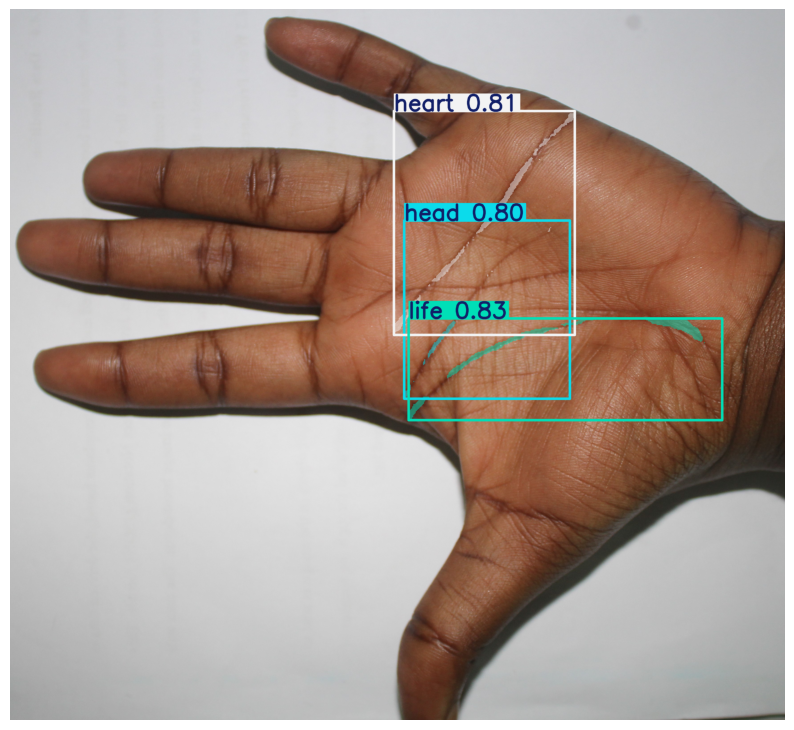

In [10]:
from ultralytics import YOLO

# Load your newly trained custom model
model = YOLO('/kaggle/working/runs/segment/train/weights/best.pt')

# Run inference on a new test image 
# (Replace 'path_to_test_image.jpg' with a real image path from your dataset)
results = model.predict(source='/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG', conf=0.25, save=True)

# If you are in a Jupyter/Kaggle environment and want to plot the image inline:
import matplotlib.pyplot as plt
import cv2

# The saved image will be in the runs/segment/predict directory
res_plotted = results[0].plot()
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [2]:
!pip install roboflow

from roboflow import Roboflow
from ultralytics import YOLO
import yaml
import os
# --- 1. DOWNLOAD DATASET ---
rf = Roboflow(api_key="d76mR4wC9JcibxUbtbvT")
project = rf.workspace("ieatfoodtolive14-gmail-com").project("palm-lines-c99iw")
version = project.version(4)
dataset = version.download("yolov11")
                
# --- 2. FIX YAML PATHS & PREVENT DATA LEAKAGE ---
print("Fixing folder paths...")
yaml_path = f"{dataset.location}/data.yaml"

with open(yaml_path, 'r') as f:
    yaml_data = yaml.safe_load(f)

# Ensure absolute paths are mapped properly
yaml_data['train'] = f"{dataset.location}/train/images"
yaml_data['val'] = f"{dataset.location}/valid/images"

# STRICT CHECK: Ensure validation folder exists to prevent overfitting / data leakage
if not os.path.exists(yaml_data['val']):
    raise FileNotFoundError(
        "❌ ERROR: 'valid/images' folder not found! "
        "Please go to Roboflow and make sure you generate a Train/Val/Test split (e.g., 70/20/10) "
        "before downloading. Never validate on your train folder!"
    )

with open(yaml_path, 'w') as f:
    yaml.dump(yaml_data, f)

# --- 3. TRAIN THE MODEL WITH OPTIMIZED HYPERPARAMETERS ---
print("Starting training! Please wait for all 100 epochs (or early stopping) to finish...")
model = YOLO('yolo11n-seg.pt') 

results = model.train(
    data=yaml_path, 
    epochs=100,           # Increased from 50 to allow full convergence
    imgsz=640,            # Matches your Roboflow export size
    batch=16,             # Optimal batch size for ~300 images (reduce to 8 if GPU runs out of memory)
    patience=20,          # Stops training early if validation metrics don't improve for 20 epochs
    optimizer='AdamW',    # Better segmentation convergence on small-to-medium datasets
    close_mosaic=10,      # Disables mosaic augmentation in final 10 epochs for cleaner edge detection
    plots=True            # Generates training curves and confusion matrix
)

print("✅ Training complete! Your best.pt file has been generated inside 'runs/segment/train/weights/best.pt'.")
            

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 285.0/285.0 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 45.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 21.2 MB/s eta 0:00:0000:0100:01m
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to palm-lines-4 in yolov11:: 100%|██████████| 551/551 [00:00<00:00, 6643.04it/s]


Fixing folder paths...
Starting training! Please wait for all 100 epochs (or early stopping) to finish...
Ultralytics 8.4.112 🚀 Python-3.12.13 torch-2.10.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/palm-lines-4/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=

In [32]:
!pip install groq -q


image 1/1 /kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG: 608x640 1 head, 1 heart, 1 life, 195.1ms
Speed: 3.9ms preprocess, 195.1ms inference, 5.7ms postprocess per image at shape (1, 3, 608, 640)
=== YOLO Detected Features ===
- life (Confidence: 83.15%)
- head (Confidence: 80.33%)
- heart (Confidence: 80.70%)


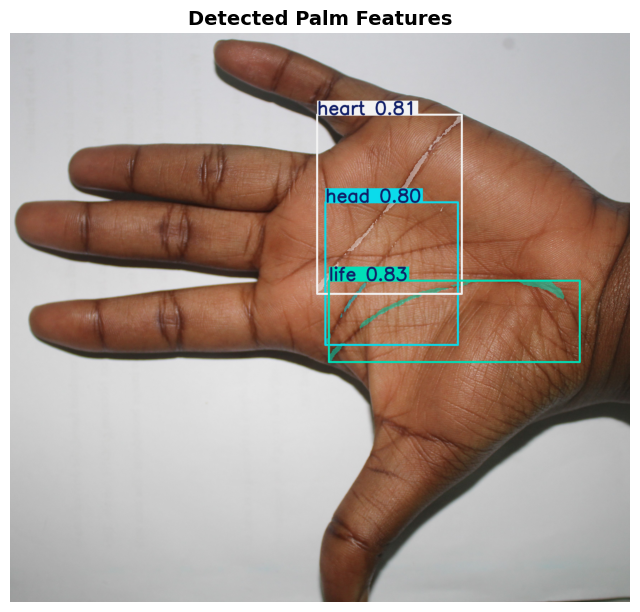


🔮 YOUR PERSONALIZED PALM READING 🔮

Dear seeker of truth, I'm delighted to delve into the mystical realm of your palm and uncover the secrets that lie within. The computer vision system has provided us with a fascinating glimpse into your palm's topography, and I shall weave a tale of insight and wonder.

### 💖 **Heart & Emotional Life**
The heart line, with a confidence level of 80.70%, reveals a profound aspect of your emotional landscape. This suggests that you are deeply empathetic and compassionate, with a strong capacity to love and be loved in return. Your emotional life is likely to be rich and complex, with a deep appreciation for the beauty of human connection. You may have a natural talent for nurturing and caring for others, which can be a powerful source of fulfillment and joy. However, beware of the tendency to prioritize others' needs over your own, as this can lead to emotional exhaustion. Remember to nurture your own heart and prioritize self-love, dear one.

### 🧠 **

In [42]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from groq import Groq
from kaggle_secrets import UserSecretsClient

# ---------------------------------------------------------
# 1. Initialize Groq Client (using Kaggle Secrets) & YOLO Model
# ---------------------------------------------------------
# Fetch the secret stored in Kaggle under the label "GROQ_API_KEY"
user_secrets = UserSecretsClient()
groq_api_key = user_secrets.get_secret("YOUR_GROQ_API_KEY_HERE")

groq_client = Groq(api_key=groq_api_key)

# Load your custom YOLO segmentation model from your Kaggle dataset
model_path = "/kaggle/input/datasets/sosona2006/best-path-pth/best.pt"
image_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG"

model = YOLO(model_path)

# ---------------------------------------------------------
# 2. Run Inference
# ---------------------------------------------------------
results = model.predict(source=image_path, conf=0.25, save=False)
result = results[0]

# ---------------------------------------------------------
# 3. Extract Detected Findings from YOLO
# ---------------------------------------------------------
detected_items = []

if result.boxes is not None and len(result.boxes) > 0:
    for box in result.boxes:
        cls_id = int(box.cls[0])
        class_name = model.names[cls_id]
        confidence = float(box.conf[0])
        detected_items.append(f"{class_name} (Confidence: {confidence:.2%})")

# Summarize findings into readable text
if detected_items:
    findings_summary = "\n".join([f"- {item}" for item in set(detected_items)])
else:
    findings_summary = "No specific palm lines or mounts were distinctly identified."

print("=== YOLO Detected Features ===")
print(findings_summary)

# ---------------------------------------------------------
# 4. Generate Palm Reading using Groq API
# ---------------------------------------------------------
prompt = f"""
You are a wise, mystical, and insightful Master Palm Reader. 

A computer vision system analyzed a photograph of a person's palm and identified the following detected features/lines:
{findings_summary}

Based on these findings, provide an insightful and engaging palm reading. 
Structure your reading into 3 distinct sections:
1. 💖 **Heart & Emotional Life**
2. 🧠 **Mind & Career Potential**
3. ✨ **Energy & Life Journey**

Keep the tone encouraging, intriguing, and mystical yet grounded.
"""

# Call Groq API
chat_completion = groq_client.chat.completions.create(
    messages=[
        {
            "role": "system",
            "content": "You are a world-renowned palmistry expert providing creative palm readings based on visual findings."
        },
        {
            "role": "user",
            "content": prompt,
        }
    ],
    model="llama-3.3-70b-versatile",
    temperature=0.7,
    max_tokens=1000
)

reading_response = chat_completion.choices[0].message.content

# ---------------------------------------------------------
# 5. Display the Visual & Palm Reading
# ---------------------------------------------------------
# Plot image with detection overlays
res_plotted = result.plot()
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
plt.title("Detected Palm Features", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

# Print the reading
print("\n" + "="*60)
print("🔮 YOUR PERSONALIZED PALM READING 🔮")
print("="*60 + "\n")
print(reading_response)


image 1/1 /kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG: 608x640 1 head, 1 heart, 1 life, 199.2ms
Speed: 3.9ms preprocess, 199.2ms inference, 5.7ms postprocess per image at shape (1, 3, 608, 640)


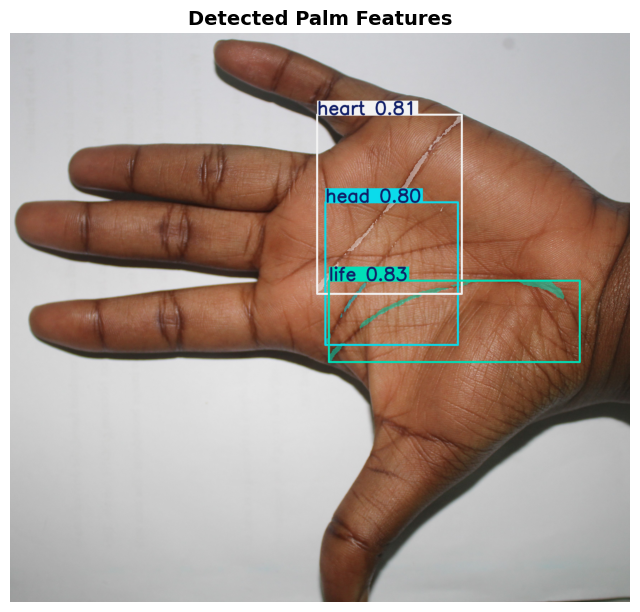

=== YOLO Detected Features ===
- life (Confidence: 83.15%)
- head (Confidence: 80.33%)
- heart (Confidence: 80.70%)

Generating your initial guidance...

🔮 YOUR PERSONALIZED PALM READING 🔮

The mystical realms of the palm have revealed their secrets to us. Let us delve into the realms of your heart, mind, and life journey, as revealed by the computer vision system's findings.

### 💖 **Heart & Emotional Life**
The heart line, with a confidence level of 80.70%, suggests that you possess a deep emotional landscape. This line is often associated with your emotional intelligence, relationships, and how you experience love and attachment. With a strong heart line, you may have a profound capacity for empathy and understanding, making you a compassionate and nurturing presence in the lives of those around you. Your emotional depth can be a source of strength, allowing you to form meaningful connections and navigate the complexities of the heart with grace and resilience.

### 🧠 **Mind & Caree

Your Question:  HOW LONG WILL I LIVE



You asked: HOW LONG WILL I LIVE

🔮 Master Palm Reader:
The profound question of longevity. The mysteries of the palm can offer insights, but it's essential to approach this topic with sensitivity and an understanding that palmistry is not a definitive predictor of lifespan. The lines on your palm can indicate tendencies, energies, and potential life paths, but the actual duration of your life is influenced by a myriad of factors, including your lifestyle, health choices, and the unpredictable nature of life itself.

The life line, which we discussed earlier, can provide some clues about your vitality, energy levels, and resilience. With a confidence level of 83.15%, your life line suggests that you possess a robust life force and the capacity to navigate life's challenges with determination and strength. However, the length of the life line is just one aspect to consider, and it's not a direct measure of the number of years you will live.

In palmistry, the life line is more about the

Your Question:  EXIT



🌙 Thank you for consulting the palm reader. May your path be illuminated. Goodbye!


In [44]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from groq import Groq
from kaggle_secrets import UserSecretsClient

# ---------------------------------------------------------
# 1. Initialize Groq Client & YOLO Model
# ---------------------------------------------------------
user_secrets = UserSecretsClient()
# NOTE: Make sure "GROQ_API_KEY" matches the exact label you saved in Kaggle Secrets!
groq_api_key = user_secrets.get_secret("YOUR_GROQ_API_KEY_HERE")

groq_client = Groq(api_key=groq_api_key)

# Load your custom YOLO segmentation model from your Kaggle dataset
model_path = "/kaggle/input/datasets/sosona2006/best-path-pth/best.pt"
image_path = "/kaggle/input/datasets/feyiamujo/human-palm-images/FEMALE/IMG_0024.JPG"

model = YOLO(model_path)

# ---------------------------------------------------------
# 2. Run Inference
# ---------------------------------------------------------
results = model.predict(source=image_path, conf=0.25, save=False)
result = results[0]

# ---------------------------------------------------------
# 3. Extract Detected Findings from YOLO
# ---------------------------------------------------------
detected_items = []

if result.boxes is not None and len(result.boxes) > 0:
    for box in result.boxes:
        cls_id = int(box.cls[0])
        class_name = model.names[cls_id]
        confidence = float(box.conf[0])
        detected_items.append(f"{class_name} (Confidence: {confidence:.2%})")

# Summarize findings into readable text
if detected_items:
    findings_summary = "\n".join([f"- {item}" for item in set(detected_items)])
else:
    findings_summary = "No specific palm lines or mounts were distinctly identified."

# ---------------------------------------------------------
# 4. Display the Visual Overlays First
# ---------------------------------------------------------
res_plotted = result.plot()
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
plt.title("Detected Palm Features", fontsize=14, fontweight='bold')
plt.axis('off')
plt.show()

print("=== YOLO Detected Features ===")
print(findings_summary)
print("\nGenerating your initial guidance...\n")

# ---------------------------------------------------------
# 5. Build the Conversation Memory & Initial Prompt
# ---------------------------------------------------------
system_instruction = (
    "You are a wise, mystical, and insightful Master Palm Reader. "
    "You provide readings based on visual findings from a computer vision model. "
    "Keep the tone encouraging, intriguing, and mystical yet grounded."
)

initial_prompt = f"""
A computer vision system analyzed a photograph of a person's palm and identified the following detected features/lines:
{findings_summary}

Based on these findings, provide an insightful and engaging basic palm reading. 
Structure your reading into 3 distinct sections:
1. 💖 **Heart & Emotional Life**
2. 🧠 **Mind & Career Potential**
3. ✨ **Energy & Life Journey**

After giving the reading, warmly invite the person to ask any follow-up questions about their palm or life path.
"""

# Store conversation history so the LLM remembers previous turns
conversation_history = [
    {"role": "system", "content": system_instruction},
    {"role": "user", "content": initial_prompt}
]

# Generate initial reading
chat_completion = groq_client.chat.completions.create(
    messages=conversation_history,
    model="llama-3.3-70b-versatile",
    temperature=0.7,
    max_tokens=1000
)

initial_reading = chat_completion.choices[0].message.content

# Add AI response to memory
conversation_history.append({"role": "assistant", "content": initial_reading})

print("="*60)
print("🔮 YOUR PERSONALIZED PALM READING 🔮")
print("="*60 + "\n")
print(initial_reading)
print("\n" + "="*60)
print("Type your question below and press Enter.")
print("Type 'exit', 'quit', or 'stop' at any time to end the session.")
print("="*60 + "\n")

# ---------------------------------------------------------
# 6. Interactive Q&A Loop
# ---------------------------------------------------------
while True:
    user_question = input("Your Question: ").strip()
    
    # Check if user wants to exit
    if user_question.lower() in ['exit', 'quit', 'stop', '']:
        print("\n🌙 Thank you for consulting the palm reader. May your path be illuminated. Goodbye!")
        break
        
    print(f"\nYou asked: {user_question}\n")
    
    # Add user's question to the conversation memory
    conversation_history.append({"role": "user", "content": user_question})
    
    # Ask Groq for an answer while keeping the conversation context
    response = groq_client.chat.completions.create(
        messages=conversation_history,
        model="llama-3.3-70b-versatile",
        temperature=0.7,
        max_tokens=800
    )
    
    answer = response.choices[0].message.content
    
    # Save answer to memory for multi-turn coherence
    conversation_history.append({"role": "assistant", "content": answer})
    
    print("🔮 Master Palm Reader:")
    print(answer)
    print("\n" + "-"*60)